<a href="https://colab.research.google.com/github/FidelRuiz/Affirmations/blob/main/Entregable2-Parte1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ENTREGABLE 2 PARTE 1


En este entregable, la elección del dataset es libre. Mi elección ha sido la siguiente: https://www.kaggle.com/datasets/rogeriovaz/villains-image-classification?resource=download

In [1]:
!unzip archive.zip

Archive:  archive.zip
  inflating: Sports-celebrity images/Kane Williamson/kane_(1).jpg  
  inflating: Sports-celebrity images/Kane Williamson/kane_(10).jpg  
  inflating: Sports-celebrity images/Kane Williamson/kane_(100).jpg  
  inflating: Sports-celebrity images/Kane Williamson/kane_(101).jpg  
  inflating: Sports-celebrity images/Kane Williamson/kane_(102).jpg  
  inflating: Sports-celebrity images/Kane Williamson/kane_(103).jpg  
  inflating: Sports-celebrity images/Kane Williamson/kane_(104).jpg  
  inflating: Sports-celebrity images/Kane Williamson/kane_(105).jpg  
  inflating: Sports-celebrity images/Kane Williamson/kane_(106).jpg  
  inflating: Sports-celebrity images/Kane Williamson/kane_(107).jpg  
  inflating: Sports-celebrity images/Kane Williamson/kane_(108).jpg  
  inflating: Sports-celebrity images/Kane Williamson/kane_(109).jpg  
  inflating: Sports-celebrity images/Kane Williamson/kane_(11).jpg  
  inflating: Sports-celebrity images/Kane Williamson/kane_(110).jpg  
  

Para poder utilizar este dataset debo crear los diferentes conjuntos y para ello el siguiente código.

In [2]:
import os
import shutil
import random

testpath = os.path.join("Sports-celebrity images", "test")
trainpath = os.path.join("Sports-celebrity images", "train")

os.makedirs(testpath, exist_ok=True)
os.makedirs(trainpath, exist_ok=True)

for folder in os.listdir("Sports-celebrity images"):

  folderpath = os.path.join("Sports-celebrity images", folder)
  images=[]

  villain_test = os.path.join(testpath, folder)
  villain_train = os.path.join(trainpath, folder)
  os.makedirs(villain_test, exist_ok=True)
  os.makedirs(villain_train, exist_ok=True)

  for filename in os.listdir(folderpath):

    _, extension = os.path.splitext(filename)
    if extension.lower() in [".jpg", ".jpeg", ".png", ".bmp", ".gif"]: 
          filepath = os.path.join(folderpath, filename)
          images.append(filepath)

  testnum = int(len(images)*0.25)
  random.shuffle(images) 
  testlist = images[:testnum]
  trainlist = images[testnum:]

  for filepath in trainlist:
          finalpath = os.path.join(villain_train, os.path.basename(filepath))
          shutil.copy(filepath, finalpath)   

  for filepath in testlist:
          finalpath = os.path.join(villain_test, os.path.basename(filepath))
          shutil.copy(filepath, finalpath) 

for folder2 in os.listdir("Sports-celebrity images"):
  if os.path.isdir(os.path.join("Sports-celebrity images",folder2)):
    if folder2 != "train" and folder2 != "test":
      shutil.rmtree(os.path.join("Sports-celebrity images",folder2))   

print(trainlist)   

['Sports-celebrity images/Kane Williamson/kane_(7).jpg', 'Sports-celebrity images/Kane Williamson/kane_(92).jpg', 'Sports-celebrity images/Kane Williamson/kane_(114).jpg', 'Sports-celebrity images/Kane Williamson/kane_(9).jpg', 'Sports-celebrity images/Kane Williamson/kane_(4).jpg', 'Sports-celebrity images/Kane Williamson/kane_(84).jpg', 'Sports-celebrity images/Kane Williamson/kane_(5).jpg', 'Sports-celebrity images/Kane Williamson/kane_(69).jpg', 'Sports-celebrity images/Kane Williamson/kane_(115).jpg', 'Sports-celebrity images/Kane Williamson/kane_(32).jpg', 'Sports-celebrity images/Kane Williamson/kane_(95).jpg', 'Sports-celebrity images/Kane Williamson/kane_(47).jpg', 'Sports-celebrity images/Kane Williamson/kane_(113).jpg', 'Sports-celebrity images/Kane Williamson/kane_(55).jpg', 'Sports-celebrity images/Kane Williamson/kane_(30).jpg', 'Sports-celebrity images/Kane Williamson/kane_(44).jpg', 'Sports-celebrity images/Kane Williamson/kane_(57).jpg', 'Sports-celebrity images/Kane W

A partir de aqui seguiremos las instrucciones dadas, comenzando por 

In [3]:
!pip install fastai -Uq

In [4]:
from fastai.vision.all import *
from google.colab import files
from sklearn.model_selection import train_test_split

### Cargando el dataset

A continuación vamos a mostrar cómo se carga el dataset para poder posteriormente crear nuestro modelo. Este proceso se hace en dos pasos. Primero se construye un objeto `DataBlock` y a continuación se construye un objeto `DataLoader` a partir del `DataBlock`. Tienes más información sobre estos objetos en la documentación de [FastAI](https://docs.fast.ai/tutorial.datablock.html).

### Datablock

Comenzamos construyendo el objeto `DataBlock`. A continuación explicaremos cada una de sus componentes. 

In [5]:
db = DataBlock(blocks = (ImageBlock, CategoryBlock),
                 get_items=get_image_files, 
                 splitter=RandomSplitter(valid_pct=0.2,seed=42),
                 get_y=parent_label,
                 item_tfms = Resize(512),
                 batch_tfms=[*aug_transforms(size=256,min_scale=0.75),Normalize.from_stats(*imagenet_stats)]) 

In [6]:
trainPath = Path('Sports-celebrity images/train')

### Dataloader

Pasamos ahora a construir nuestro `DataLoader` que se construye a partir del `DataBlock` construido anteriormente indicándole el path donde se encuentran nuestras imágenes. Además podemos configurar el `DataLoader` indicándole el tamaño del batch que queremos utilizar. Al trabajar con GPUs es importante que usemos batches de tamaño 2^n para optimizar el uso de la GPU.

In [7]:
dls = db.dataloaders(trainPath,bs=128)

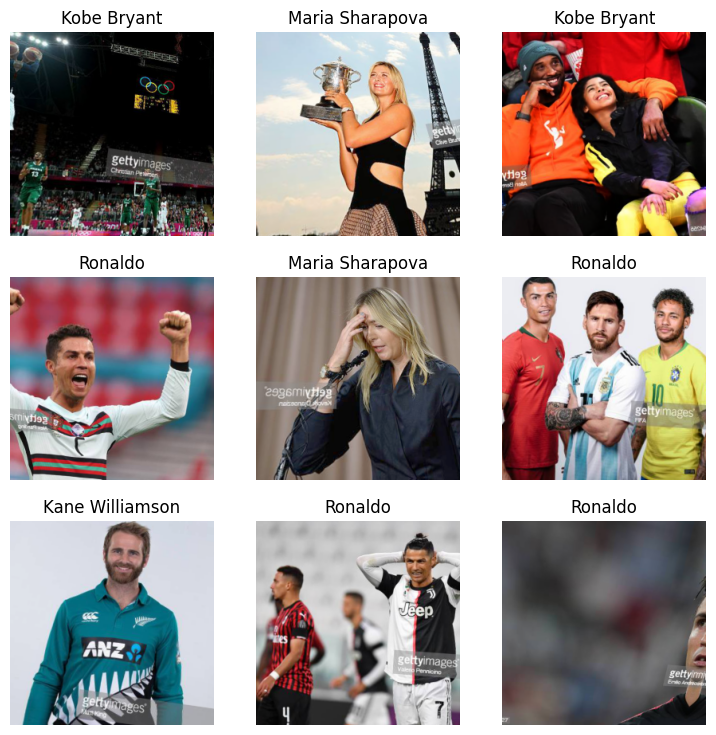

In [8]:
dls.show_batch()

## Creando el modelo de predicción

A continuación vamos a crear nuestra red convolucional usando *transfer learning* y utilizando como base la arquitectura [ResNet 18](https://arxiv.org/abs/1512.03385); aunque existen otros [modelos disponibles](https://wandb.ai/capecape/imagenette_timm/reports/Checking-Out-the-New-fastai-timm-Integration--VmlldzoxOTMzNzMw) este modelo proporciona buenos resultados. Al crear nuestra red convolucional también debemos indicar la [métrica](https://docs.fast.ai/metrics.html#metrics) que vamos a utilizar para medir el rendimiento del modelo, en este caso vamos a usar el error_rate y la accuracy.

La primera vez que se ejecuta la siguiente instrucción puede llevar algún tiempo debido a que se tienen que descargar los pesos asociados a la red ResNet 18. 



In [9]:
learn = vision_learner(dls,resnet18,metrics=accuracy).to_fp16()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 219MB/s]


### Entrenando la red

El siguiente paso es entrenar la red. Para ello vamos a utilizar el [siguiente procedimiento](https://sgugger.github.io/the-1cycle-policy.html) basado en la idea de fine-tuning:

1. En primer lugar se dejan fijos (congelados) los pesos de la mayoría de capas de la red y sólo se actualizan los de las últimas capas. 
2. Se descongelan todas las capas de la red. 
3. Se reentrenan todas las capas de la red pero utilizando distintos *learning rates* en cada capa. 

La librería fastai proporciona toda la funcionalidad necesaria para llevar a cabo este proceso mediante el método `fine_tune`.

In [10]:
learn.fine_tune(10,base_lr=1e-3)

epoch,train_loss,valid_loss,accuracy,time
0,2.546903,1.705892,0.257576,00:08


epoch,train_loss,valid_loss,accuracy,time
0,2.065500,1.409766,0.378788,00:04
1,1.989728,1.105987,0.454545,00:05
2,1.805706,0.828738,0.621212,00:04
3,1.606372,0.623571,0.757576,00:04
4,1.456674,0.505973,0.803030,00:05
5,1.333267,0.445336,0.833333,00:04
6,1.209273,0.417413,0.848485,00:04
7,1.101704,0.409259,0.863636,00:04
8,1.021417,0.399710,0.863636,00:04
9,0.948814,0.398851,0.848485,00:05


In [13]:
learn.export()

In [14]:
Path().ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

## Interpretación de los resultados

Vamos a interpretar los resultados utilizando la matriz de confusión.

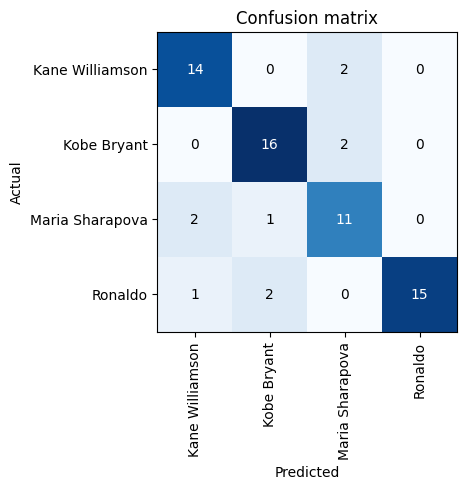

In [15]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

### Evaluando el modelo en el conjunto de test

Para poder evaluar nuestro modelo en el conjunto de test debemos crear un nuevo `DataBlock` y un nuevo `DataLoader`. La única diferencia con el `DataBlock` utilizado previamente es que para hacer la partición del dataset usamos un objeto de la clase `GrandparentSplitter` indicando que el conjunto de validación es nuestro conjunto de test. En el caso del `DataLoader`, la diferencia con el definido anteriormente es que cambiamos la ruta al path. 

In [18]:
dbTest = DataBlock(blocks = (ImageBlock, CategoryBlock),
                 get_items=get_image_files, 
                 splitter=GrandparentSplitter(valid_name='test'),
                 get_y=parent_label,
                 item_tfms = Resize(256),
                 batch_tfms=[*aug_transforms(size=256,min_scale=0.75),Normalize.from_stats(*imagenet_stats)] )
dlsTest =  dbTest.dataloaders("Sports-celebrity images",bs=128)

In [19]:
learn.dls = dlsTest

In [20]:
learn.validate()

(#2) [0.6560948491096497,0.7962962985038757]

## Limpiando el dataset

Como hemos comentado anteriormente puede ocurrir que haya imágenes en nuestro dataset que no deberían estar ahí.


In [21]:
from fastai.vision.widgets import ImageClassifierCleaner

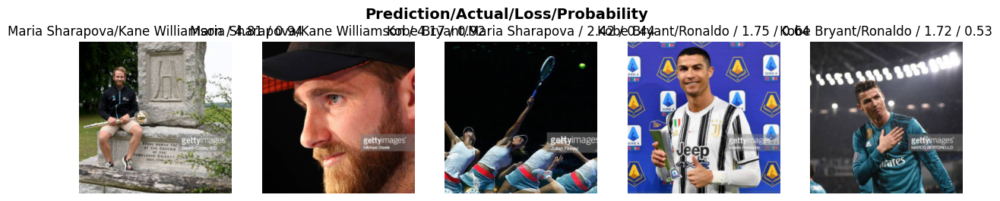

In [22]:
interp.plot_top_losses(5,nrows=1)

In [23]:
from fastai.vision.widgets import ImageClassifierCleaner
cleaner = ImageClassifierCleaner(learn)
cleaner

In [25]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [26]:
learn_inf = load_learner('export.pkl')


### Usando el modelo

Vamos a ver cómo usar el modelo ante una nueva imagen. Para ello lo primero que vamos a hacer es cargar dicho modelo. 

In [27]:
!wget https://www.realmadrid.com/img/vertical_380px/cristiano_550x650_20180917025046.jpg -O ron.png

--2023-05-16 01:12:41--  https://www.realmadrid.com/img/vertical_380px/cristiano_550x650_20180917025046.jpg
Resolving www.realmadrid.com (www.realmadrid.com)... 104.98.128.125
Connecting to www.realmadrid.com (www.realmadrid.com)|104.98.128.125|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 21144 (21K) [image/jpeg]
Saving to: ‘ron.png’

ron.png             100%[===================>]  20.65K  --.-KB/s    in 0s      

2023-05-16 01:12:41 (204 MB/s) - ‘ron.png’ saved [21144/21144]



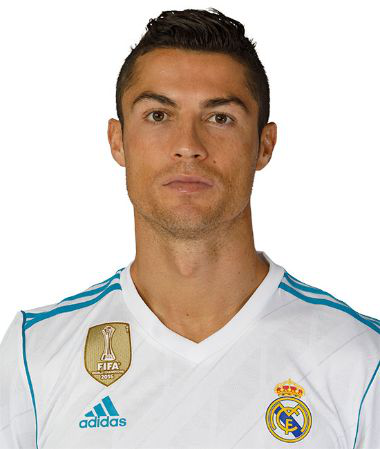

In [28]:
import PIL
img = PILImage.create('ron.png')
img

In [29]:
learn_inf.predict('ron.png')

('Ronaldo', tensor(3), tensor([0.0916, 0.0471, 0.0221, 0.8392]))

In [30]:
!wget https://www.sportball.es/wp-content/uploads/2017/08/kobe_bryant_con_competencia.jpg -O kob.png

--2023-05-16 01:14:28--  https://www.sportball.es/wp-content/uploads/2017/08/kobe_bryant_con_competencia.jpg
Resolving www.sportball.es (www.sportball.es)... 188.114.96.0, 188.114.97.0, 2a06:98c1:3121::, ...
Connecting to www.sportball.es (www.sportball.es)|188.114.96.0|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 219613 (214K) [image/jpeg]
Saving to: ‘kob.png’

kob.png             100%[===================>] 214.47K  --.-KB/s    in 0.03s   

2023-05-16 01:14:28 (7.40 MB/s) - ‘kob.png’ saved [219613/219613]



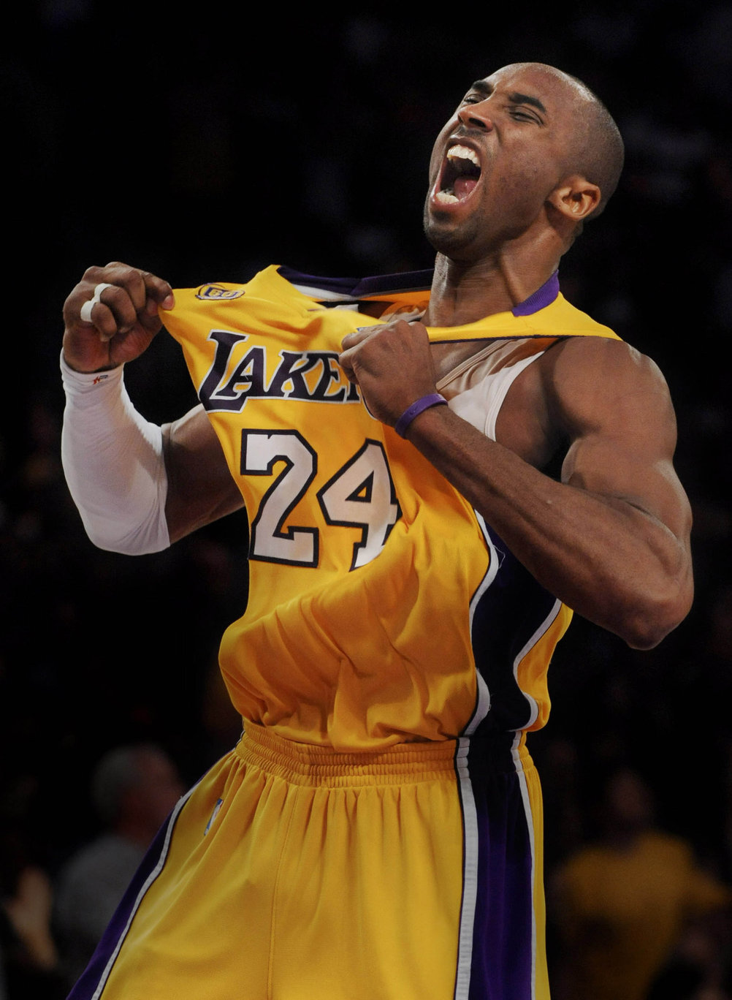

In [31]:
import PIL
img = PILImage.create('kob.png')
img

In [32]:
learn_inf.predict('kob.png')

('Kobe Bryant',
 tensor(1),
 tensor([8.8359e-06, 9.9924e-01, 6.7719e-04, 7.2803e-05]))

In [34]:
!wget https://media.revistavanityfair.es/photos/60e8331a29af8ce08356ca78/master/w_1600%2Cc_limit/221311.jpg -O sar.png

--2023-05-16 01:18:23--  https://media.revistavanityfair.es/photos/60e8331a29af8ce08356ca78/master/w_1600%2Cc_limit/221311.jpg
Resolving media.revistavanityfair.es (media.revistavanityfair.es)... 151.101.0.239, 151.101.64.239, 151.101.128.239, ...
Connecting to media.revistavanityfair.es (media.revistavanityfair.es)|151.101.0.239|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 195881 (191K) [image/jpeg]
Saving to: ‘sar.png’

sar.png             100%[===================>] 191.29K  --.-KB/s    in 0.009s  

2023-05-16 01:18:23 (21.2 MB/s) - ‘sar.png’ saved [195881/195881]



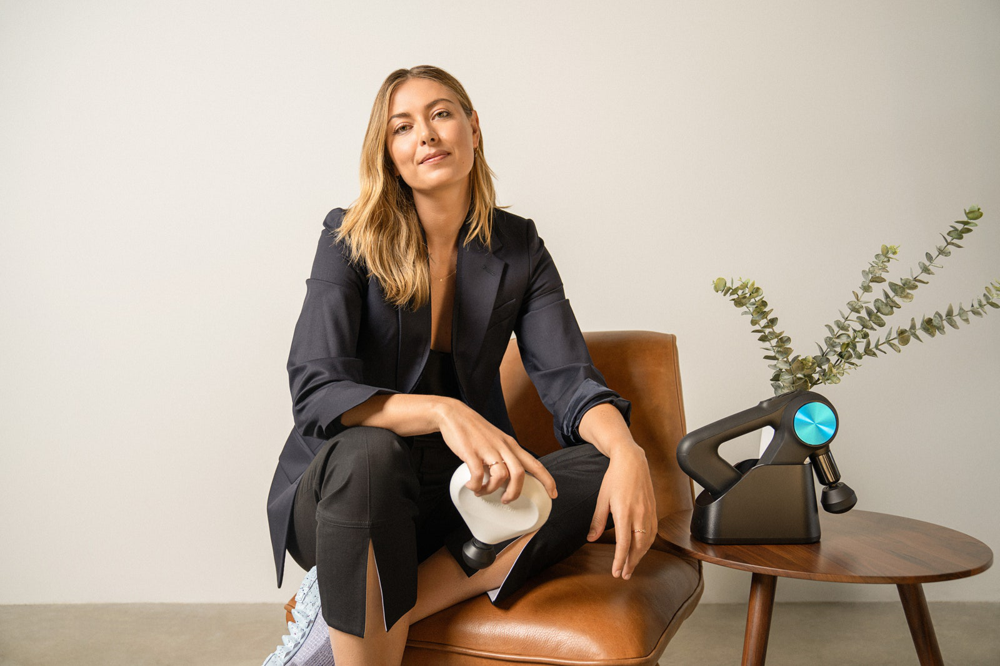

In [35]:
import PIL
img = PILImage.create('sar.png')
img

In [36]:
learn_inf.predict('sar.png')

('Maria Sharapova',
 tensor(2),
 tensor([7.5456e-03, 1.0645e-02, 9.8164e-01, 1.6553e-04]))

## Creando una aplicación para nuestro modelo

Es fundamental que los modelos sean usables, por lo que es conveniente proporcionar una interfaz secilla que permita usar nuestros modelos. Para ello, vamos a usar dos herramientas: [Gradio](https://gradio.app/) y los [espacios de HuggingFace](https://huggingface.co/spaces). En concreto vamos a ver cómo construir la siguiente [aplicación](https://huggingface.co/spaces/AP2223/Practica1).

En primer lugar es necesario que crees una [cuenta en HuggingFace](https://huggingface.co/join). Este paso sólo hay que realizarlo una vez. Además debes  [crear un token de escritura](https://huggingface.co/docs/hub/security-tokens).

Una vez realizados esos dos pasos vamos a descargar una librería que permita subir nuestro modelo a HuggingFace. 

In [37]:
!pip install huggingface_hub["fastai"] -Uq

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 13.1 MB/s eta 0:00:00


In [38]:
from huggingface_hub import notebook_login

notebook_login()

In [39]:
from huggingface_hub import push_to_hub_fastai

# repo_id = "YOUR_USERNAME/YOUR_LEARNER_NAME"
repo_id = "firuiz/deportistas"

push_to_hub_fastai(learner=learn, repo_id=repo_id)

model.pkl:   0%|          | 0.00/47.0M [00:00<?, ?B/s]

Upload 1 LFS files:   0%|          | 0/1 [00:00<?, ?it/s]

'https://huggingface.co/firuiz/deportistas/tree/main/'